# GeneralisedFilters.jl: Efficient Inference for State Space Models

This notebook introduces `GeneralisedFilters.jl`, a component of the Turing.jl ecosystem specialising in efficient inference in state space models.

It is written to provide a high-level run-through of the expansive feature set that the package offers, through the lens of a case study on trend inflation modelling.

## State Space Models

- SSM diagram
- Filtering, smoothing and parameter inference
- Explanation of why we want optimised algorithms for SSM inference

## Motivation for GeneralisedFilters.jl

The goal of GeneralisedFilters.jl is to provide modular components for building state-of-the-art SSM inference algorithms whilst ensuring high computational efficiency.

The primary design philosophy of the package is to treat Rao-Blackwellisation—a power techinque for reduce the effective dimensionality of SSM inference problems—as a first-class citizen.

The majority of SSM inference packages do not natively support Rao-Blackwellisation.

And even those that do often implement it in a rigid manner, typically forcing you to use a pre-specified combination of component algorithms.

<img src="GF_motivation_1.png" width="1000px"/>


In GeneralisedFilters.jl, however, Rao-Blackwellisation is implemented in a highly modular fashion, allowing users to easily mix-and-match different algorithms.

<img src="GF_motivation_2.png" width="1000px"/>

## Case Study: Trend Inflation

TODO: Charles to introduce model and data

## Setup

In [1]:
import Pkg
Pkg.activate(".")

  Activating project at `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics`


In [2]:
Pkg.add([
    "BenchmarkTools",
    "CSV",
    "DataFrames",
    "Distributions",
    # "GeneralisedFilters",
    "LogExpFunctions",
    "MatrixEquations",
    "PDMats",
    "Plots",
    # "SSMProblems",
    "StaticArrays",
    "Statistics"
])

   Resolving package versions...
     Project No packages added to or removed from `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/Project.toml`
    Manifest No packages added to or removed from `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/Manifest.toml`
Precompiling packages...
   1031.6 ms  ✓ AdvancedPS
    898.1 ms  ✓ AdvancedPS → AdvancedPSLibtaskExt
   2599.9 ms  ✓ Turing
  3 dependencies successfully precompiled in 6 seconds. 735 already precompiled.


In [3]:
Pkg.develop(path="../../GeneralisedFilters.jl/GeneralisedFilters")
Pkg.develop(path="../../GeneralisedFilters.jl/SSMProblems")

   Resolving package versions...
     Project No packages added to or removed from `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/Project.toml`
    Manifest No packages added to or removed from `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/Project.toml`
    Manifest No packages added to or removed from `/scratch/th542/Turing-Workshop/2025-CFE-CMStatistics/Manifest.toml`


In [4]:
using Random
rng = MersenneTwister(1234);

### Data Loading

In [5]:
using CSV, DataFrames

fred_data = CSV.read("fred_data.csv", DataFrame)

Row,date,pce,gdp,unrate
,Date,Float64,Float64,Float64
1,1960-01-01,0.41456,816.542,5.4
2,1960-04-01,2.04062,816.002,5.4
3,1960-07-01,1.6199,816.49,5.5
4,1960-10-01,1.8944,815.199,6.6
5,1961-01-01,0.20426,815.872,6.9
6,1961-04-01,0.17865,817.555,6.9
7,1961-07-01,1.65505,819.458,6.7
8,1961-10-01,0.10163,821.4,6.0
9,1962-01-01,2.35556,823.168,5.6


In [6]:
K = length(fred_data.gdp)

255

### Preliminary: Static Arrays

GeneralisedFilters.jl provides extensive support for [StaticArrays.jl](https://github.com/JuliaArrays/StaticArrays.jl), a framework for stack-allocated, fixed-size arrays in Julia.

This is particularly useful for state space models with low-dimensional states (roughly $D \leq 10$), where the overhead of heap allocation can be significant.

In [7]:
using BenchmarkTools
using LinearAlgebra
using StaticArrays

A = rand(4, 4)
B = @SMatrix rand(4, 4)

println("Benchmark timings for base Julia arrays: ")
@btime det($A);
println("\nBenchmark timings for StaticArrays: ")
@btime det($B);

Benchmark timings for base Julia arrays: 
  135.430 ns (4 allocations: 304 bytes)

Benchmark timings for StaticArrays: 
  2.934 ns (0 allocations: 0 bytes)


If you define your state space models to use `StaticArrays`, GeneralisedFilters.jl preverse this type information and performs all computations using `StaticArrays`.

### Preliminary: Type Parameters

TODO: provide a quick reminder of why concrete types are important for performance in Julia and how to use type parameters to achieve this.

## Linear Gaussian Models: The Kalman Filter

We start by looking at a class of state space models that have a closed-form filtering/smoothing distribution.

This is the class of linear Gaussian state space models (LGSSMs). The model is defined as follows:

\begin{align*}
x_0 &\sim \mathcal{N}(\mu_0, \Sigma_0) \\
x_k &= A_k x_{k-1} + b_k + q_k, \quad &q_k \sim \mathcal{N}(0, Q_k) \\
y_k &= H_k x_k + c_k + r_k, \quad &r_k \sim \mathcal{N}(0, R_k)
\end{align*}

where the model matrices $A_k$, $b_k$, $Q_k$, $H_k$, $c_k$ and $R_k$ may be time-varying.



It can be showed that the filtering distribution $p(x_k | y_{1:k})$ remains Gaussian for all $k$, and can be computed exactly using the Kalman filter algorithm. This is a recursive algorithm that proceeds in two steps at each time $k$:
1. **Prediction step:** Compute the predictive distribution $p(x_k | y_{1:k-1})$ using the state dynamics.
2. **Update step:** Update the predictive distribution to obtain the filtering distribution $p(x_k | y_{1:k})$ using the new observation $y_k$.

### Model Definition

In [8]:
using GeneralisedFilters
using SSMProblems  # defines StateSpaceModel and non-specialised dynamics/observations
using PDMats: PDMat

const GF = GeneralisedFilters

GeneralisedFilters

In [9]:
struct TrendCycleDynamics{ΦT,ΚT} <: LinearGaussianLatentDynamics
    m::Int64
    n::Int64
    ϕ::ΦT
    σκ²::ΚT
end

In [10]:
GF.calc_A(cycle::TrendCycleDynamics, ::Integer; kwargs...) = cycle.ϕ

In [11]:
function GF.calc_b(cycle::TrendCycleDynamics{ΦT}, ::Integer; kwargs...) where {ΦT}
    return zeros(eltype(ΦT), cycle.m + 2 * cycle.n)
end

TODO: mention PDMat return type, or can relax this constraint?

TODO: what is the best symbol for stochastic volatility?

TODO: I think the eltype conversion might be overkill for this tutorial

In [12]:
function GF.calc_Q(
    cycle::TrendCycleDynamics{ΦT,ΚT}, ::Integer; new_outer, kwargs...
) where {ΦT,ΚT}
    vols = new_outer
    T = Base.promote_type(eltype(ΦT), ΚT, eltype(vols))
    Σ = zeros(T, cycle.m + 2 * cycle.n, cycle.m + 2 * cycle.n)
    Σ[1:(cycle.m), 1:(cycle.m)] .= exp(vols[1])
    Σ[(end-1):end, (end-1):end] = cycle.σκ² * I(2)

    cholΣ = zero(Σ)
    cholΣ[1:(cycle.m), 1:(cycle.m)] .= exp(vols[1] / 2)
    cholΣ[(end-1):end, (end-1):end] = sqrt(cycle.σκ²) * I(2)

    return PDMat(Σ, Cholesky(UpperTriangular(cholΣ)))
end

In [13]:
struct TrendObservation{T<:Real} <: LinearGaussianObservationProcess
    m::Int64
    n::Int64
end

In [14]:
function GF.calc_H(obs::TrendObservation{T}, ::Integer; kwargs...) where {T}
    return [ones(T, 1); zeros(T, obs.m - 1); ones(T, 1); zeros(T, 2 * obs.n - 1);;]'
end

In [15]:
function GF.calc_c(obs::TrendObservation{T}, ::Integer; kwargs...) where {T}
    return zeros(T, 1)
end

In [16]:
function GF.calc_R(::TrendObservation, ::Integer; new_outer, kwargs...)
    vols = new_outer
    return PDMat([exp(vols[2]);;])
end

In [17]:
using MatrixEquations: lyapd

function stochastic_cyle(n::Int64, ρ::Real, λ::Real)
    cosλ = cospi(λ)
    sinλ = sinpi(λ)

    ϕ = kron(I(n), ρ * [cosλ sinλ; -sinλ cosλ])
    ϕ += kron(diagm(1 => ones(n - 1)), I(2))

    return ϕ
end

function stochastic_trend(m::Int64)
    return UpperTriangular(ones(Bool, m, m))
end

function create_bandpass_model(
    n::Int64, m::Int64, ρ::Real, λ::Real, γ::ΓT, σκ²::Real, init_state::Real
) where {ΓT<:Real}
    ϕ1 = stochastic_trend(m)
    ϕ2 = stochastic_cyle(n, ρ, λ)

    Σ1 = 1000I(m)
    Σ2 = lyapd(ϕ2, kron(Diagonal([zeros(eltype(ϕ2), n - 1); one(eltype(ϕ2))]), σκ² * I(2)))

    bandpass_model = StateSpaceModel(
        HomogeneousGaussianPrior(
            [init_state; zeros(m - 1 + 2 * n)], PDMat(cat(Σ1, Σ2; dims=(1, 2)))
        ),
        TrendCycleDynamics(m, n, cat(ϕ1, ϕ2; dims=(1, 2)), σκ²),
        TrendObservation{eltype(ϕ2)}(m, n),
    )
end

create_bandpass_model (generic function with 1 method)

In [18]:
m = 2
n = 2
ρ = 0.714
λ = 0.352
γ = 1.5
σκ² = 2.54
init_state = 816.542;

In [19]:
bandpass_model = create_bandpass_model(2, 2, 0.714, 0.352, 1.5, 2.54, 816.542)
average_historic_vols = [0.0198, 0.0138];

In [52]:
# Perform Kalman filtering
kf = KalmanFilter(jitter=1e-8)  # add a small jitter for numerical stability

kalman_posteriors = []
state = initialise(prior(bandpass_model), kf)
for k in 1:K
    obs = [fred_data.gdp[k]]  # treat as a 1-dimensional vector
    state, _ = GF.step(bandpass_model, kf, k, state, obs; new_outer=average_historic_vols)
    push!(kalman_posteriors, state)
end

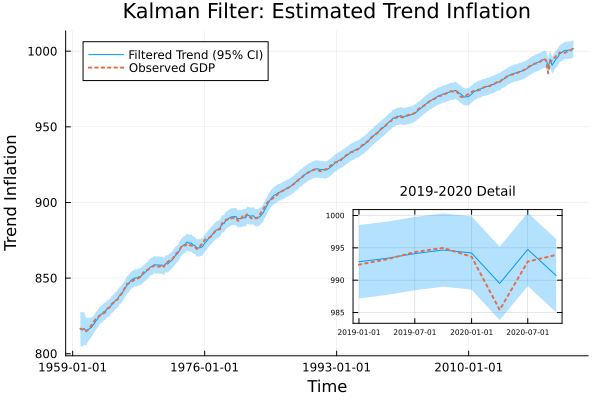

In [53]:
using Plots
using Dates

# Extract the means and standard deviations from the Kalman posteriors
posterior_means = [state.μ[1] for state in kalman_posteriors]
posterior_stds = [sqrt(state.Σ[1, 1]) for state in kalman_posteriors]

# Plot the filtered trend with uncertainty bands
p = plot(
    fred_data.date, posterior_means,
    ribbon=1.96 * posterior_stds,
    label="Filtered Trend (95% CI)",
    xlabel="Time",
    ylabel="Trend Inflation",
    title="Kalman Filter: Estimated Trend Inflation",
    legend=:best,
    fillalpha=0.3
)

# Overlay the observed data
plot!(
    fred_data.date, fred_data.gdp,
    label="Observed GDP",
    linestyle=:dot,
    linewidth=2
)

# Create inset plot for 2019-2020
inset_indices = findall(x -> year(x) >= 2019 && year(x) <= 2020, fred_data.date)
plot!(
    p,
    inset=(1, bbox(0.05, 0.1, 0.4, 0.35, :bottom, :right)),
    subplot=2,
    bg_inside=:white
)

plot!(
    fred_data.date[inset_indices], posterior_means[inset_indices],
    ribbon=1.96 * posterior_stds[inset_indices],
    subplot=2,
    label="",
    fillalpha=0.3,
    xlabel="",
    ylabel="",
    title="2019-2020 Detail",
    titlefontsize=9,
    tickfontsize=5,
    framestyle=:box
)

plot!(
    fred_data.date[inset_indices], fred_data.gdp[inset_indices],
    subplot=2,
    label="",
    linestyle=:dot,
    linewidth=2
)

display(p)

## Stochastic Volatility: Hierarchical Models

TODO: update model description and introduce particle filter

In [22]:
using Distributions

struct StochasticVolatilityPrior{T<:Real} <: StatePrior end

function SSMProblems.distribution(prior::StochasticVolatilityPrior{T}; kwargs...) where {T}
    return product_distribution(Normal(zero(T), T(1)), Normal(zero(T), T(1)))
end

In [23]:
struct StochasticVolatility{ΓT<:AbstractVector} <: LatentDynamics
    γ::ΓT
end

function SSMProblems.distribution(
    proc::StochasticVolatility, step::Integer, state::AbstractVector{T}; kwargs...
) where {T<:Real}
    μ = state
    Σ = Diagonal((proc.γ) .^ 2)
    return MvNormal(μ, Σ)
end

In [24]:
stoch_vol_prior = StochasticVolatilityPrior{typeof(γ)}()
stoch_vol_process = StochasticVolatility(fill(γ, 2))

StochasticVolatility{Vector{Float64}}([1.5, 1.5])

In [35]:
stoch_vol_model = HierarchicalSSM(
    stoch_vol_prior,
    stoch_vol_process, 
    bandpass_model
)

HierarchicalSSM{StochasticVolatilityPrior{Float64}, StochasticVolatility{Vector{Float64}}, StateSpaceModel{HomogeneousGaussianPrior{Vector{Float64}, PDMat{Float64, Matrix{Float64}}}, TrendCycleDynamics{Matrix{Float64}, Float64}, TrendObservation{Float64}}}(StochasticVolatilityPrior{Float64}(), StochasticVolatility{Vector{Float64}}([1.5, 1.5]), StateSpaceModel{HomogeneousGaussianPrior{Vector{Float64}, PDMat{Float64, Matrix{Float64}}}, TrendCycleDynamics{Matrix{Float64}, Float64}, TrendObservation{Float64}}(HomogeneousGaussianPrior{Vector{Float64}, PDMat{Float64, Matrix{Float64}}}([816.542, 0.0, 0.0, 0.0, 0.0, 0.0], [1000.0 0.0 … 0.0 0.0; 0.0 1000.0 … 0.0 0.0; … ; 0.0 0.0 … 5.18151626669713 -2.4888713405374157e-17; 0.0 0.0 … -2.4888713405374157e-17 5.18151626669713]), TrendCycleDynamics{Matrix{Float64}, Float64}(2, 2, [1.0 1.0 … 0.0 0.0; 0.0 1.0 … 0.0 0.0; … ; 0.0 0.0 … 0.32014561628828303 0.6382027768440023; 0.0 0.0 … -0.6382027768440023 0.32014561628828303], 2.54), TrendObservation{Flo

In [36]:
N_particles = 1000
pf = BootstrapFilter(N_particles)

ParticleFilter{ESSResampler, GeneralisedFilters.LatentProposal}(1000, ESSResampler(1.0, Systematic()), GeneralisedFilters.LatentProposal())

In [37]:
pf_cb = DenseAncestorCallback(nothing)
ys = [[gdp] for gdp in fred_data.gdp]
GF.filter(rng, stoch_vol_model, pf, ys; callback=pf_cb);

In [38]:
pf_history = pf_cb.container

DenseParticleContainer{GeneralisedFilters.HierarchicalState{Vector{Float64}, Vector{Float64}}, Float64}(Vector{GeneralisedFilters.HierarchicalState{Vector{Float64}, Vector{Float64}}}[[GeneralisedFilters.HierarchicalState{Vector{Float64}, Vector{Float64}}([-0.8119504431140863, 2.562239139935283], [819.8083682678613, -6.705651531505546, 14.585189667858609, 0.05984474192234826, 0.23220710094108932, -4.558865721872448]), GeneralisedFilters.HierarchicalState{Vector{Float64}, Vector{Float64}}([-1.4579618702421895, -0.8652356929269293], [840.8614309378993, 47.9618858313027, -10.239685704437527, -5.623967550589714, -1.3512599147146673, -0.4980484873450932]), GeneralisedFilters.HierarchicalState{Vector{Float64}, Vector{Float64}}([0.6774711568131662, -1.3218207337353425], [872.743082132297, -88.48588967017118, 0.7202775791827959, 0.3895469148725403, 1.7239500017319218, 0.28722873368384466]), GeneralisedFilters.HierarchicalState{Vector{Float64}, Vector{Float64}}([-0.1291961233334799, 0.5162344432

In [39]:
using LogExpFunctions: softmax  # converts log weights to normalised weights

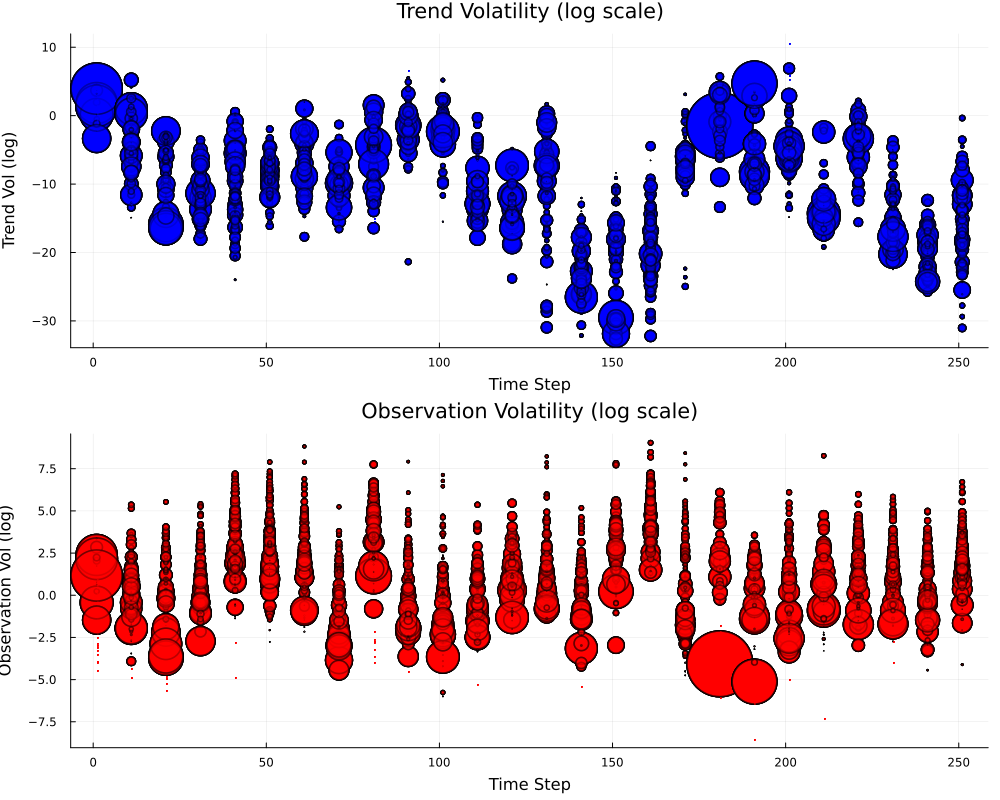

In [40]:
# Extract particles and weights for visualization
n_particles = length(pf_history.particles[1])

# Create a plot showing particles over time
p_particles = plot(
    layout=(2, 1),
    size=(1000, 800),
    xlabel="Time Step",
    title=["Trend Volatility (log scale)" "Observation Volatility (log scale)"],
    legend=false
)

# Sample every 10th timestep to avoid overcrowding
time_indices = 1:10:K
for (idx, k) in enumerate(time_indices)
    # Get first 100 particles and weights at time k
    particles = pf_history.particles[k][1:100]
    log_weights = pf_history.weights[k][1:100]

    # Convert to normalized weights using softmax
    weights = softmax(log_weights)

    # Scale point sizes (multiply by constant for visibility)
    point_sizes = sqrt.(weights) .* 50

    # Extract volatility values (outer state: .x has first and second dimensions)
    vol1_particles = [p.x[1] for p in particles]
    vol2_particles = [p.x[2] for p in particles]

    # Plot particles with size proportional to weight
    scatter!(
        p_particles,
        fill(k, n_particles),
        vol1_particles,
        markersize=point_sizes,
        alpha=0.5,
        color=:blue,
        subplot=1
    )

    scatter!(
        p_particles,
        fill(k, n_particles),
        vol2_particles,
        markersize=point_sizes,
        alpha=0.5,
        color=:red,
        subplot=2
    )
end

ylabel!(p_particles[1], "Trend Vol (log)")
ylabel!(p_particles[2], "Observation Vol (log)")

display(p_particles)

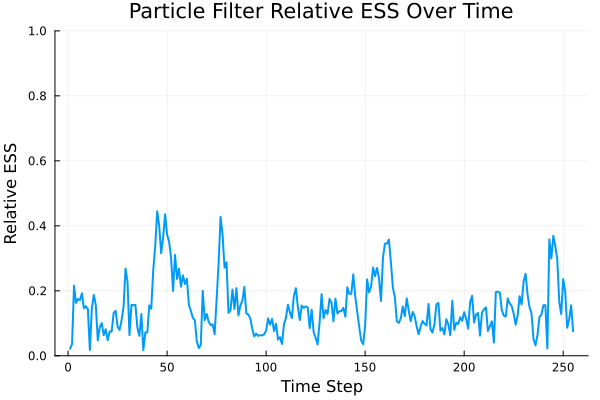

In [47]:
pf_esses = Vector{Float64}(undef, K)
for k in 1:K
    log_weights = pf_history.weights[k]
    weights = softmax(log_weights)
    pf_esses[k] = 1 / sum(weights .^ 2)
end

# Plot relative ESSes over time
p_ess = plot(
    1:K, pf_esses ./ N_particles,
    xlabel="Time Step",
    ylabel="Relative ESS",
    title="Particle Filter Relative ESS Over Time",
    legend=false,
    ylim=(0, 1),
    lw = 2
)

## Rao-Blackwellised Particle Filtering

In [42]:
rbpf = RBPF(pf, kf)

RBPF{ParticleFilter{ESSResampler, GeneralisedFilters.LatentProposal}, KalmanFilter}(ParticleFilter{ESSResampler, GeneralisedFilters.LatentProposal}(1000, ESSResampler(1.0, Systematic()), GeneralisedFilters.LatentProposal()), KalmanFilter(1.0e-8))

In [44]:
rbpf_cb = DenseAncestorCallback(nothing)
GF.filter(rng, stoch_vol_model, rbpf, ys; callback=rbpf_cb);
rbpf_history = rbpf_cb.container;

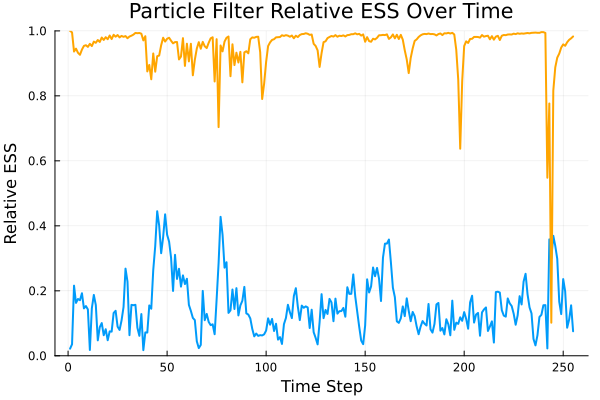

In [48]:
rbpf_esses = Vector{Float64}(undef, K)
for k in 1:K
    log_weights = rbpf_history.weights[k]
    weights = softmax(log_weights)
    rbpf_esses[k] = 1 / sum(weights .^ 2)
end 

# Add to existing ESS plot
plot!(
    p_ess,
    1:K, rbpf_esses ./ N_particles,
    label="RBPF",
    color=:orange,
    lw = 2
)

### First-Class Rao-Blackwellisation: Auxiliary RBPF

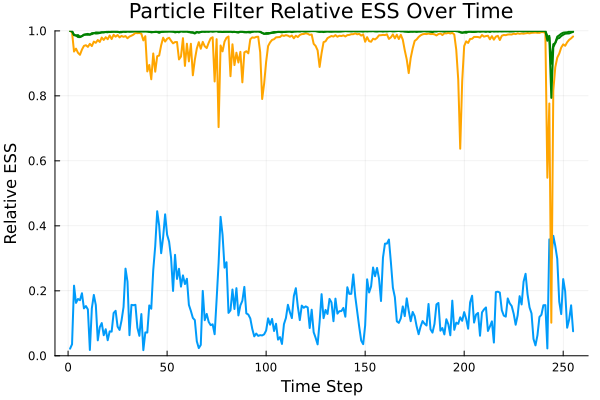

In [51]:
arbpf = AuxiliaryParticleFilter(rbpf, MeanPredictive())
arbpf_cb = DenseAncestorCallback(nothing)
GF.filter(rng, stoch_vol_model, arbpf, ys; callback=arbpf_cb);
arbpf_history = arbpf_cb.container
arbpf_esses = Vector{Float64}(undef, K)
for k in 1:K
    log_weights = arbpf_history.weights[k]
    weights = softmax(log_weights)
    arbpf_esses[k] = 1 / sum(weights .^ 2)
end

# Add to existing ESS plot
plot!(
    p_ess,
    1:K, arbpf_esses ./ N_particles,
    label="Auxiliary RBPF",
    color=:green,
    lw = 2
)

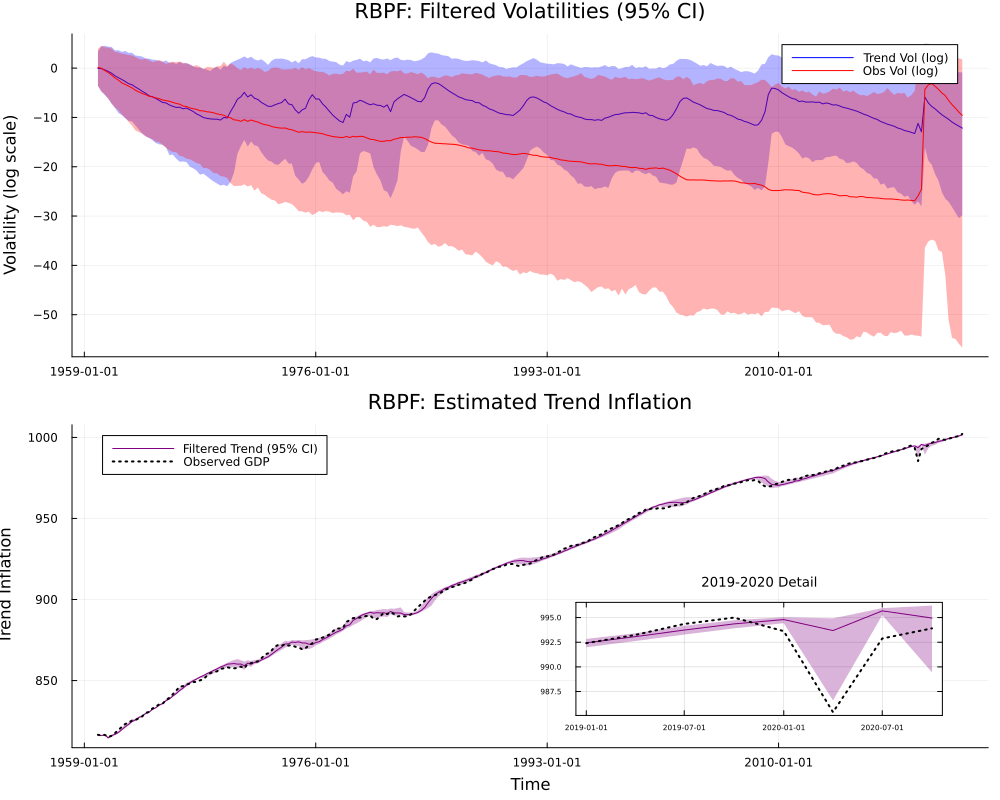

In [54]:
# Extract RBPF posteriors for visualization
rbpf_vol1_means = Vector{Float64}(undef, K)
rbpf_vol1_lower = Vector{Float64}(undef, K)
rbpf_vol1_upper = Vector{Float64}(undef, K)

rbpf_vol2_means = Vector{Float64}(undef, K)
rbpf_vol2_lower = Vector{Float64}(undef, K)
rbpf_vol2_upper = Vector{Float64}(undef, K)

rbpf_trend_means = Vector{Float64}(undef, K)
rbpf_trend_lower = Vector{Float64}(undef, K)
rbpf_trend_upper = Vector{Float64}(undef, K)

using Statistics

for k in 1:K
    particles = rbpf_history.particles[k]
    log_weights = rbpf_history.weights[k]
    weights = softmax(log_weights)
    
    # Extract volatilities (outer state)
    vol1_vals = [p.x[1] for p in particles]
    vol2_vals = [p.x[2] for p in particles]
    
    # Extract trend (first element of inner Kalman state mean)
    trend_vals = [p.z.μ[1] for p in particles]
    
    # Compute weighted statistics
    rbpf_vol1_means[k] = sum(weights .* vol1_vals)
    rbpf_vol2_means[k] = sum(weights .* vol2_vals)
    rbpf_trend_means[k] = sum(weights .* trend_vals)
    
    # Compute 95% credible intervals
    sorted_idx1 = sortperm(vol1_vals)
    sorted_idx2 = sortperm(vol2_vals)
    sorted_idx_trend = sortperm(trend_vals)
    
    cumsum_weights1 = cumsum(weights[sorted_idx1])
    cumsum_weights2 = cumsum(weights[sorted_idx2])
    cumsum_weights_trend = cumsum(weights[sorted_idx_trend])
    
    lower_idx1 = findfirst(x -> x >= 0.025, cumsum_weights1)
    upper_idx1 = findfirst(x -> x >= 0.975, cumsum_weights1)
    rbpf_vol1_lower[k] = vol1_vals[sorted_idx1[lower_idx1]]
    rbpf_vol1_upper[k] = vol1_vals[sorted_idx1[upper_idx1]]
    
    lower_idx2 = findfirst(x -> x >= 0.025, cumsum_weights2)
    upper_idx2 = findfirst(x -> x >= 0.975, cumsum_weights2)
    rbpf_vol2_lower[k] = vol2_vals[sorted_idx2[lower_idx2]]
    rbpf_vol2_upper[k] = vol2_vals[sorted_idx2[upper_idx2]]
    
    lower_idx_trend = findfirst(x -> x >= 0.025, cumsum_weights_trend)
    upper_idx_trend = findfirst(x -> x >= 0.975, cumsum_weights_trend)
    rbpf_trend_lower[k] = trend_vals[sorted_idx_trend[lower_idx_trend]]
    rbpf_trend_upper[k] = trend_vals[sorted_idx_trend[upper_idx_trend]]
end

# Create 2-panel plot
p_rbpf = plot(
    layout=(2, 1),
    size=(1000, 800),
    link=:x
)

# Top panel: Filtered volatilities
plot!(
    p_rbpf,
    fred_data.date, rbpf_vol1_means,
    ribbon=(rbpf_vol1_means .- rbpf_vol1_lower, rbpf_vol1_upper .- rbpf_vol1_means),
    label="Trend Vol (log)",
    fillalpha=0.3,
    color=:blue,
    subplot=1,
    ylabel="Volatility (log scale)",
    title="RBPF: Filtered Volatilities (95% CI)",
    legend=:topright
)

plot!(
    p_rbpf,
    fred_data.date, rbpf_vol2_means,
    ribbon=(rbpf_vol2_means .- rbpf_vol2_lower, rbpf_vol2_upper .- rbpf_vol2_means),
    label="Obs Vol (log)",
    fillalpha=0.3,
    color=:red,
    subplot=1
)

# Bottom panel: Trend inflation with inset
plot!(
    p_rbpf,
    fred_data.date, rbpf_trend_means,
    ribbon=(rbpf_trend_means .- rbpf_trend_lower, rbpf_trend_upper .- rbpf_trend_means),
    label="Filtered Trend (95% CI)",
    fillalpha=0.3,
    color=:purple,
    subplot=2,
    xlabel="Time",
    ylabel="Trend Inflation",
    title="RBPF: Estimated Trend Inflation",
    legend=:best
)

# Overlay observed data
plot!(
    p_rbpf,
    fred_data.date, fred_data.gdp,
    label="Observed GDP",
    linestyle=:dot,
    linewidth=2,
    color=:black,
    subplot=2
)

# Create inset plot for 2019-2020
inset_indices = findall(x -> year(x) >= 2019 && year(x) <= 2020, fred_data.date)
plot!(
    p_rbpf,
    inset=(2, bbox(0.05, 0.1, 0.4, 0.35, :bottom, :right)),
    subplot=3,
    bg_inside=:white
)

plot!(
    fred_data.date[inset_indices], rbpf_trend_means[inset_indices],
    ribbon=(rbpf_trend_means[inset_indices] .- rbpf_trend_lower[inset_indices], 
            rbpf_trend_upper[inset_indices] .- rbpf_trend_means[inset_indices]),
    subplot=3,
    label="",
    fillalpha=0.3,
    color=:purple,
    xlabel="",
    ylabel="",
    title="2019-2020 Detail",
    titlefontsize=9,
    tickfontsize=5,
    framestyle=:box
)

plot!(
    fred_data.date[inset_indices], fred_data.gdp[inset_indices],
    subplot=3,
    label="",
    linestyle=:dot,
    linewidth=2,
    color=:black
)

display(p_rbpf)

## Parameter Inference

### Particle-Marginal Metropolis-Hastings using Turing.jl

### Particle Gibbs with Ancestor Sampling